<a href="https://colab.research.google.com/github/Nageswar-Sahoo/Computer-Vision-Project/blob/main/S12/Assignment8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/Nageswar-Sahoo/Computer-Vision-Project.git

Cloning into 'Computer-Vision-Project'...
remote: Enumerating objects: 8835, done.
remote: Counting objects: 100% (8835/8835), done.
remote: Compressing objects: 100% (8450/8450), done.
remote: Total 8835 (delta 1015), reused 7875 (delta 281), pack-reused 0
Receiving objects: 100% (8835/8835), 304.48 MiB | 34.91 MiB/s, done.
Resolving deltas: 100% (1015/1015), done.
Checking out files: 100% (14842/14842), done.


In [2]:
!pip install albumentations==0.4.6
import albumentations 
from albumentations.pytorch import ToTensorV2

     |████████████████████████████████| 117 kB 8.0 MB/s 
     |████████████████████████████████| 948 kB 40.3 MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.6-py3-none-any.whl size=65172 sha256=8313277f97740a15dae9729e691cd1bfc56906dd631ec3b1c88c945760447aeb
  Stored in directory: /root/.cache/pip/wheels/cf/34/0f/cb2a5f93561a181a4bcc84847ad6aaceea8b5a3127469616cc
Successfully built albumentations
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [4]:
cd Computer-Vision-Project/template

/content/Computer-Vision-Project/template


In [10]:
!git pull

remote: Enumerating objects: 73, done.
remote: Counting objects: 100% (73/73), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 67 (delta 33), reused 7 (delta 5), pack-reused 0
Unpacking objects: 100% (67/67), done.
From https://github.com/Nageswar-Sahoo/Computer-Vision-Project
   6354b4d..1094a1b  main       -> origin/main
Updating 6354b4d..1094a1b
Fast-forward
 S12/README.md                    | 81 +++++++++++++++++++++++-----------------
 template/transformation/trsfm.py | 14 +++----
 2 files changed, 51 insertions(+), 44 deletions(-)


In [87]:
from torch.optim.lr_scheduler import StepLR

from parse_config import ConfigParser
from trainer import Trainer
from utils import prepare_device
from utils import get_splited_data
import model.loss as module_loss
import model.metric as module_metric
import torch.optim as optim
import logging
import numpy as np
import torch
import model.stn as module_stn
import utils
SEED = 123
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(SEED)
import torch
import data_loader.data_loaders as data_loaders
import torchvision.models as models
import torch.nn as nn
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
plt.ion()   # interactive mode
from torchvision.utils import make_grid


In [88]:
    logger = logging.getLogger("trian")
    # Read the config.json
    config = ConfigParser.from_args()

    data_loader = data_loaders.get_train_data_loader(512)

    valid_data_loader = data_loaders.get_test_data_loader(512)

    # build model architecture, then print to console
    model = module_stn.STNModel()

    logger.info(model)

    # prepare for (multi-device) GPU training
    n_gpu = 1
    device, device_ids = prepare_device(n_gpu)
    model = model.to(device)
    if len(device_ids) > 1:
        model = torch.nn.DataParallel(model, device_ids=device_ids)

    # get function handles of loss and metrics
    criterion = module_loss.crossentropyloss
    metrics = [module_metric.accuracy]

    # optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    # lr_scheduler = StepLR(optimizer, step_size=20, gamma=0.1)
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    lr_scheduler = StepLR(optimizer, step_size=15, gamma=0.1)

    trainer = Trainer(model, criterion, metrics, optimizer,
                      config=config,
                      device=device,
                      data_loader=data_loader,
                      valid_data_loader=valid_data_loader,
                      lr_scheduler=lr_scheduler)

    

Files already downloaded and verified
Files already downloaded and verified
STN(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=10, bias=True)
  (localization): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1))
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): ReLU(inplace=True)
  )
  (fc_loc): Sequential(
    (0): Linear(in_features=2048, out_features=256, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=256, out_feat

In [89]:
cat config.json

{
    "name": "TinyImageNet",
    "trainer": {
        "epochs": 50,
        "save_dir": "saved/",
        "save_period": 1,
        "verbosity": 2,
        "monitor": "min val_loss",
        "early_stop": 50,
        "tensorboard": true
    }
}


Train Epoch: 1 [0/98 (0%)] Loss: 2.301227


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


Train Epoch: 1 [22/98 (22%)] Loss: 2.301105
Train Epoch: 1 [44/98 (45%)] Loss: 2.288711
Train Epoch: 1 [66/98 (67%)] Loss: 2.232550
Train Epoch: 1 [88/98 (90%)] Loss: 2.128561
    epoch          : 1
    loss           : 2.244937981878008
    accuracy       : 14.725689382896016
    val_loss       : 2.053748869895935
    val_accuracy   : 25.761144301470587
Saving checkpoint: saved/models/TinyImageNet/1226_161843/checkpoint-epoch1.pth ...
Saving current best: model_best.pth ...
Train Epoch: 2 [0/98 (0%)] Loss: 2.086211
Train Epoch: 2 [22/98 (22%)] Loss: 1.992009
Train Epoch: 2 [44/98 (45%)] Loss: 1.921761
Train Epoch: 2 [66/98 (67%)] Loss: 1.740791
Train Epoch: 2 [88/98 (90%)] Loss: 1.659090
    epoch          : 2
    loss           : 1.852966539713801
    accuracy       : 32.1341259718173
    val_loss       : 1.6584801614284514
    val_accuracy   : 39.21817555147059
Saving checkpoint: saved/models/TinyImageNet/1226_161843/checkpoint-epoch2.pth ...
Saving current best: model_best.pth ...


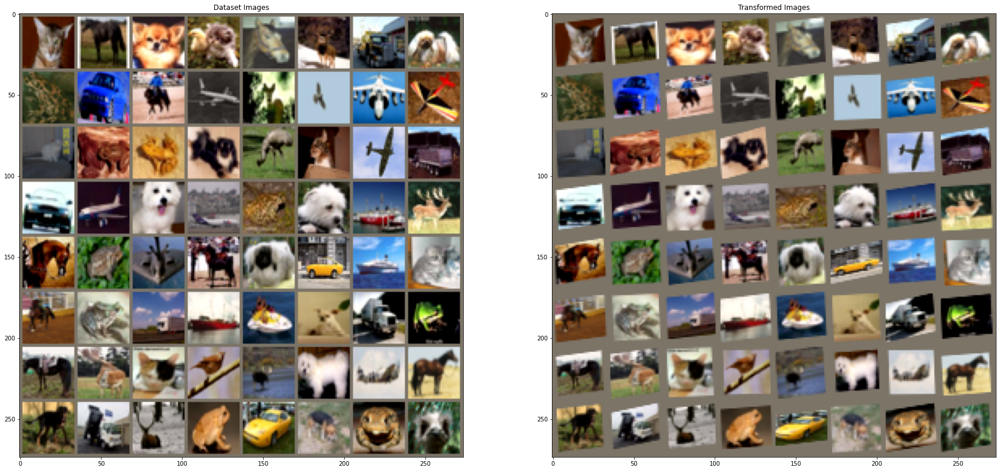

In [75]:
def convert_image_np(inp):
    """Convert a Tensor to numpy image."""
    """
    This function transforms the PyTorch image grids
    into NumPy format that we will denormalize and save 
    as PNG file.
    """
    image_grid = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image_grid = std * image_grid + mean
    return image_grid

# We want to visualize the output of the spatial transformers layer
# after the training, we visualize a batch of input images and
# the corresponding transformed batch using STN.


def visualize_stn():
    with torch.no_grad():
        # Get a batch of training data
        data = next(iter(data_loader))[0].to(device)
        data = data[:64]
        model=trainer.model



        input_tensor =data.cpu()
        transformed_input_tensor = model.stn(data).cpu().detach()

        in_grid = convert_image_np(
            torchvision.utils.make_grid(input_tensor))

        out_grid = convert_image_np(
            torchvision.utils.make_grid(transformed_input_tensor))

        # Plot the results side-by-side
        f, axarr = plt.subplots(1, 2, figsize=(30, 30))
        axarr[0].imshow(in_grid)
        axarr[0].set_title('Dataset Images')
        axarr[1].imshow(out_grid)
        axarr[1].set_title('Transformed Images')

trainer.train()
visualize_stn()
plt.ioff()
plt.show()



Train Epoch: 1 [0/98 (0%)] Loss: 2.301227


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


Train Epoch: 1 [22/98 (22%)] Loss: 2.301105
Train Epoch: 1 [44/98 (45%)] Loss: 2.288711
Train Epoch: 1 [66/98 (67%)] Loss: 2.232550
Train Epoch: 1 [88/98 (90%)] Loss: 2.128561
    epoch          : 1
    loss           : 2.244937981878008
    accuracy       : 14.725689382896016
    val_loss       : 2.053748869895935
    val_accuracy   : 25.761144301470587
Saving checkpoint: saved/models/TinyImageNet/1226_162026/checkpoint-epoch1.pth ...
Saving current best: model_best.pth ...
Train Epoch: 2 [0/98 (0%)] Loss: 2.086211
Train Epoch: 2 [22/98 (22%)] Loss: 1.992009
Train Epoch: 2 [44/98 (45%)] Loss: 1.921761
Train Epoch: 2 [66/98 (67%)] Loss: 1.740791
Train Epoch: 2 [88/98 (90%)] Loss: 1.659090
    epoch          : 2
    loss           : 1.852966539713801
    accuracy       : 32.1341259718173
    val_loss       : 1.6584801614284514
    val_accuracy   : 39.21817555147059
Saving checkpoint: saved/models/TinyImageNet/1226_162026/checkpoint-epoch2.pth ...
Saving current best: model_best.pth ...


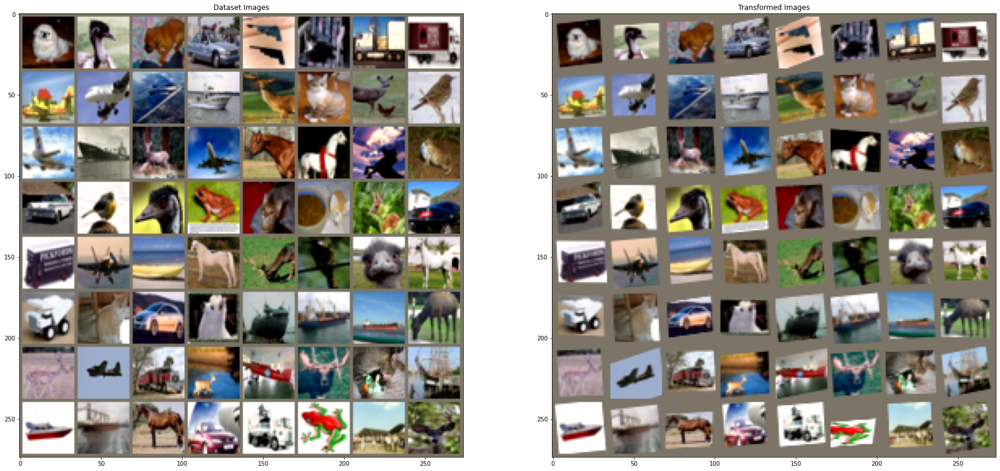

In [78]:
def convert_image_np(inp):
    """Convert a Tensor to numpy image."""
    """
    This function transforms the PyTorch image grids
    into NumPy format that we will denormalize and save 
    as PNG file.
    """
    image_grid = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image_grid = std * image_grid + mean
    return image_grid

# We want to visualize the output of the spatial transformers layer
# after the training, we visualize a batch of input images and
# the corresponding transformed batch using STN.


def visualize_stn():
    with torch.no_grad():
        # Get a batch of training data
        data = next(iter(data_loader))[0].to(device)
        data = data[:64]
        model=trainer.model



        input_tensor =data.cpu()
        transformed_input_tensor = model.stn(data).cpu().detach()

        in_grid = convert_image_np(
            torchvision.utils.make_grid(input_tensor))

        out_grid = convert_image_np(
            torchvision.utils.make_grid(transformed_input_tensor))

        # Plot the results side-by-side
        f, axarr = plt.subplots(1, 2, figsize=(30, 30))
        axarr[0].imshow(in_grid)
        axarr[0].set_title('Dataset Images')
        axarr[1].imshow(out_grid)
        axarr[1].set_title('Transformed Images')

trainer.train()
visualize_stn()
plt.ioff()
plt.show()



Train Epoch: 1 [0/98 (0%)] Loss: 2.301227


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


Train Epoch: 1 [22/98 (22%)] Loss: 2.301105
Train Epoch: 1 [44/98 (45%)] Loss: 2.288711
Train Epoch: 1 [66/98 (67%)] Loss: 2.232550
Train Epoch: 1 [88/98 (90%)] Loss: 2.128561
    epoch          : 1
    loss           : 2.244937981878008
    accuracy       : 14.725689382896016
    val_loss       : 2.053748869895935
    val_accuracy   : 25.761144301470587
Saving checkpoint: saved/models/TinyImageNet/1226_162503/checkpoint-epoch1.pth ...
Saving current best: model_best.pth ...
Train Epoch: 2 [0/98 (0%)] Loss: 2.086211
Train Epoch: 2 [22/98 (22%)] Loss: 1.992009
Train Epoch: 2 [44/98 (45%)] Loss: 1.921761
Train Epoch: 2 [66/98 (67%)] Loss: 1.740791
Train Epoch: 2 [88/98 (90%)] Loss: 1.659090
    epoch          : 2
    loss           : 1.852966539713801
    accuracy       : 32.1341259718173
    val_loss       : 1.6584801614284514
    val_accuracy   : 39.21817555147059
Saving checkpoint: saved/models/TinyImageNet/1226_162503/checkpoint-epoch2.pth ...
Saving current best: model_best.pth ...


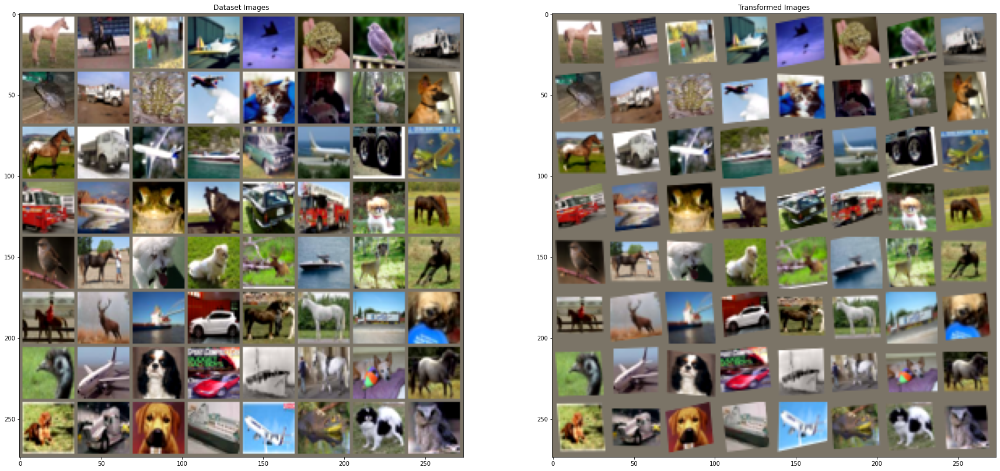

In [82]:
def convert_image_np(inp):
    """Convert a Tensor to numpy image."""
    """
    This function transforms the PyTorch image grids
    into NumPy format that we will denormalize and save 
    as PNG file.
    """
    image_grid = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image_grid = std * image_grid + mean
    return image_grid

# We want to visualize the output of the spatial transformers layer
# after the training, we visualize a batch of input images and
# the corresponding transformed batch using STN.


def visualize_stn():
    with torch.no_grad():
        # Get a batch of training data
        data = next(iter(data_loader))[0].to(device)
        data = data[:64]
        model=trainer.model



        input_tensor =data.cpu()
        transformed_input_tensor = model.stn(data).cpu().detach()

        in_grid = convert_image_np(
            torchvision.utils.make_grid(input_tensor))

        out_grid = convert_image_np(
            torchvision.utils.make_grid(transformed_input_tensor))

        # Plot the results side-by-side
        f, axarr = plt.subplots(1, 2, figsize=(30, 30))
        axarr[0].imshow(in_grid)
        axarr[0].set_title('Dataset Images')
        axarr[1].imshow(out_grid)
        axarr[1].set_title('Transformed Images')

trainer.train()
visualize_stn()
plt.ioff()
plt.show()



Train Epoch: 1 [0/98 (0%)] Loss: 2.301227


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


Train Epoch: 1 [22/98 (22%)] Loss: 2.301105
Train Epoch: 1 [44/98 (45%)] Loss: 2.288711
Train Epoch: 1 [66/98 (67%)] Loss: 2.232550
Train Epoch: 1 [88/98 (90%)] Loss: 2.128561
    epoch          : 1
    loss           : 2.244937981878008
    accuracy       : 14.725689382896016
    val_loss       : 2.053748869895935
    val_accuracy   : 25.761144301470587
Saving checkpoint: saved/models/TinyImageNet/1226_163109/checkpoint-epoch1.pth ...
Saving current best: model_best.pth ...
Train Epoch: 2 [0/98 (0%)] Loss: 2.086211
Train Epoch: 2 [22/98 (22%)] Loss: 1.992009
Train Epoch: 2 [44/98 (45%)] Loss: 1.921761
Train Epoch: 2 [66/98 (67%)] Loss: 1.740791
Train Epoch: 2 [88/98 (90%)] Loss: 1.659090
    epoch          : 2
    loss           : 1.852966539713801
    accuracy       : 32.1341259718173
    val_loss       : 1.6584801614284514
    val_accuracy   : 39.21817555147059
Saving checkpoint: saved/models/TinyImageNet/1226_163109/checkpoint-epoch2.pth ...
Saving current best: model_best.pth ...


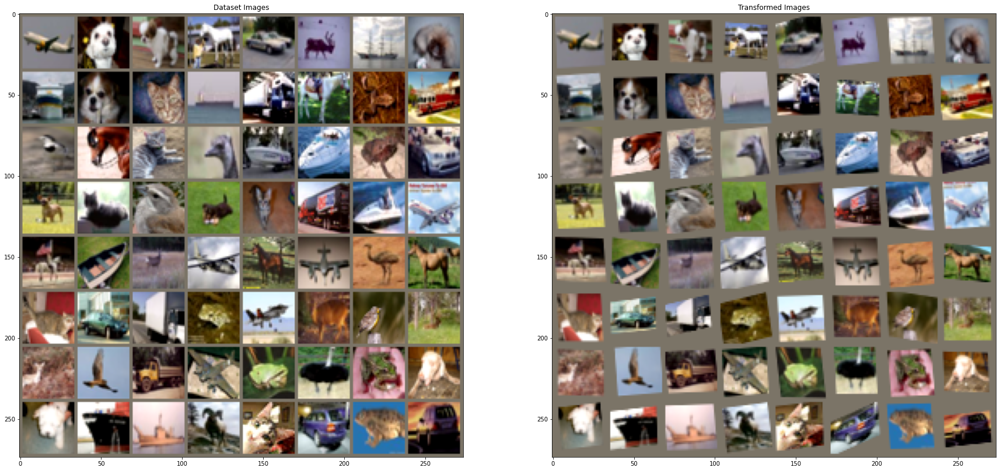

In [86]:
def convert_image_np(inp):
    """Convert a Tensor to numpy image."""
    """
    This function transforms the PyTorch image grids
    into NumPy format that we will denormalize and save 
    as PNG file.
    """
    image_grid = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image_grid = std * image_grid + mean
    return image_grid

# We want to visualize the output of the spatial transformers layer
# after the training, we visualize a batch of input images and
# the corresponding transformed batch using STN.


def visualize_stn():
    with torch.no_grad():
        # Get a batch of training data
        data = next(iter(data_loader))[0].to(device)
        data = data[:64]
        model=trainer.model



        input_tensor =data.cpu()
        transformed_input_tensor = model.stn(data).cpu().detach()

        in_grid = convert_image_np(
            torchvision.utils.make_grid(input_tensor))

        out_grid = convert_image_np(
            torchvision.utils.make_grid(transformed_input_tensor))

        # Plot the results side-by-side
        f, axarr = plt.subplots(1, 2, figsize=(30, 30))
        axarr[0].imshow(in_grid)
        axarr[0].set_title('Dataset Images')
        axarr[1].imshow(out_grid)
        axarr[1].set_title('Transformed Images')

trainer.train()
visualize_stn()
plt.ioff()
plt.show()



Train Epoch: 1 [0/98 (0%)] Loss: 2.301227


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


Train Epoch: 1 [22/98 (22%)] Loss: 2.301105
Train Epoch: 1 [44/98 (45%)] Loss: 2.288711
Train Epoch: 1 [66/98 (67%)] Loss: 2.232550
Train Epoch: 1 [88/98 (90%)] Loss: 2.128561
    epoch          : 1
    loss           : 2.244937981878008
    accuracy       : 14.725689382896016
    val_loss       : 2.053748869895935
    val_accuracy   : 25.761144301470587
Saving checkpoint: saved/models/TinyImageNet/1226_164142/checkpoint-epoch1.pth ...
Saving current best: model_best.pth ...
Train Epoch: 2 [0/98 (0%)] Loss: 2.086211
Train Epoch: 2 [22/98 (22%)] Loss: 1.992009
Train Epoch: 2 [44/98 (45%)] Loss: 1.921761
Train Epoch: 2 [66/98 (67%)] Loss: 1.740791
Train Epoch: 2 [88/98 (90%)] Loss: 1.659090
    epoch          : 2
    loss           : 1.852966539713801
    accuracy       : 32.1341259718173
    val_loss       : 1.6584801614284514
    val_accuracy   : 39.21817555147059
Saving checkpoint: saved/models/TinyImageNet/1226_164142/checkpoint-epoch2.pth ...
Saving current best: model_best.pth ...


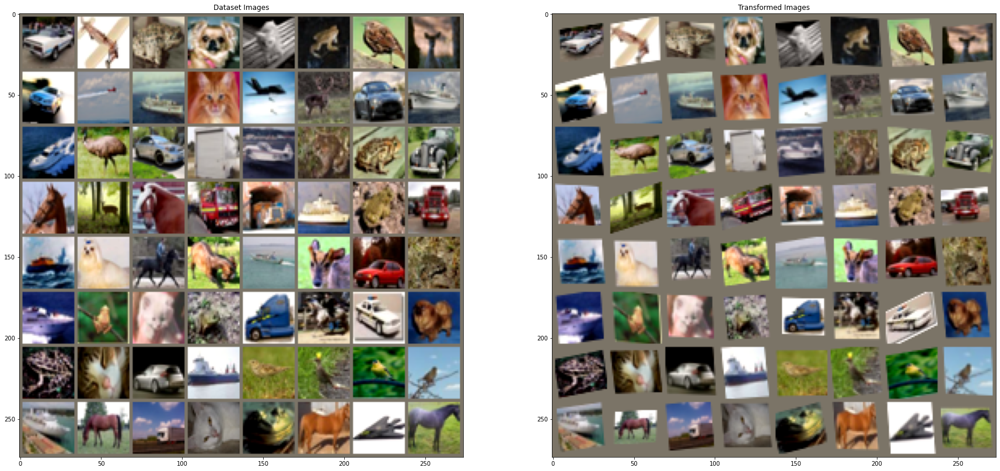

In [90]:
def convert_image_np(inp):
    """Convert a Tensor to numpy image."""
    """
    This function transforms the PyTorch image grids
    into NumPy format that we will denormalize and save 
    as PNG file.
    """
    image_grid = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image_grid = std * image_grid + mean
    return image_grid

# We want to visualize the output of the spatial transformers layer
# after the training, we visualize a batch of input images and
# the corresponding transformed batch using STN.


def visualize_stn():
    with torch.no_grad():
        # Get a batch of training data
        data = next(iter(data_loader))[0].to(device)
        data = data[:64]
        model=trainer.model



        input_tensor =data.cpu()
        transformed_input_tensor = model.stn(data).cpu().detach()

        in_grid = convert_image_np(
            torchvision.utils.make_grid(input_tensor))

        out_grid = convert_image_np(
            torchvision.utils.make_grid(transformed_input_tensor))

        # Plot the results side-by-side
        f, axarr = plt.subplots(1, 2, figsize=(30, 30))
        axarr[0].imshow(in_grid)
        axarr[0].set_title('Dataset Images')
        axarr[1].imshow(out_grid)
        axarr[1].set_title('Transformed Images')

trainer.train()
visualize_stn()
plt.ioff()
plt.show()

